## Visualize layer by layer feature maps


In [124]:
from pathlib import Path
import sys

from PIL import Image

from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.rcParams['savefig.dpi'] = 80

### Setup

In [3]:
%cd /content/
! rm -rf retinal-disease-classification
!git clone https://github.com/Tejashree-Khot/retinal-disease-classification.git

/content
Cloning into 'retinal-disease-classification'...
remote: Enumerating objects: 250, done.
remote: Counting objects: 100% (250/250), done.
remote: Compressing objects: 100% (157/157), done.
remote: Total 250 (delta 166), reused 170 (delta 89), pack-reused 0 (from 0)
Receiving objects: 100% (250/250), 8.11 MiB | 15.01 MiB/s, done.
Resolving deltas: 100% (166/166), done.


In [123]:
%cd /content/retinal-disease-classification
! git pull
! uv sync --quiet
%cd /content/retinal-disease-classification/src
sys.path.append("/content/retinal-disease-classification/src")

/content/retinal-disease-classification
Already up to date.
/content/retinal-disease-classification/src


In [93]:
! uv run python3 ../scripts/download_dataset.py

### Generate Feature Maps

In [96]:
!python3 ../scripts/visualize_feature_maps.py --model_name vgg --variant 16
!python3 ../scripts/visualize_feature_maps.py --model_name resnet --variant 50
!python3 ../scripts/visualize_feature_maps.py --model_name efficientnet --variant b7
!python3 ../scripts/visualize_feature_maps.py --model_name convnext --variant large

INFO:   Visualizing feature maps for IDRiD_1025.jpg
INFO:   Model loaded for inference from /content/retinal-disease-classification/src/../output/checkpoints/vgg_16_best_model.pt
INFO:   Loaded model for visualization from /content/retinal-disease-classification/src/../output/checkpoints/vgg_16_best_model.pt
INFO:   Animating layer evolution for vgg_16
INFO:   Animation.save using <class 'matplotlib.animation.PillowWriter'>
INFO:   Visualizing feature maps for IDRiD_1025.jpg
INFO:   Model loaded for inference from /content/retinal-disease-classification/src/../output/checkpoints/resnet_50_best_model.pt
INFO:   Loaded model for visualization from /content/retinal-disease-classification/src/../output/checkpoints/resnet_50_best_model.pt
INFO:   Animating layer evolution for resnet_50
INFO:   Animation.save using <class 'matplotlib.animation.PillowWriter'>
INFO:   Visualizing feature maps for IDRiD_1025.jpg
INFO:   Model loaded for inference from /content/retinal-disease-classification/src

In [131]:
from PIL import Image
def display_original_image(model_name: str, variant: str):
    plot_dir = Path("../output/feature_maps")
    original_image_path = plot_dir / f"{model_name}_{variant}_input_image.jpg"
    print(original_image_path)
    img = mpimg.imread(original_image_path)
    plt.imshow(img)
    plt.show()

def display_all_feature_maps(model_name: str, variant: str):
    plot_dir = Path("../output/feature_maps")
    image_paths = sorted(list(plot_dir.rglob(f"{model_name}_{variant}_*.png")))
    for image_path in image_paths:
        print("Layer", image_path.stem.split("_")[-1])
        display(Image.open(image_path))

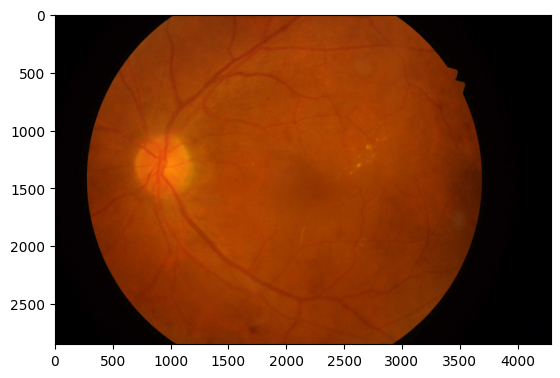

In [100]:
display_original_image("vgg", "16")

### VGG 16

Layer 0


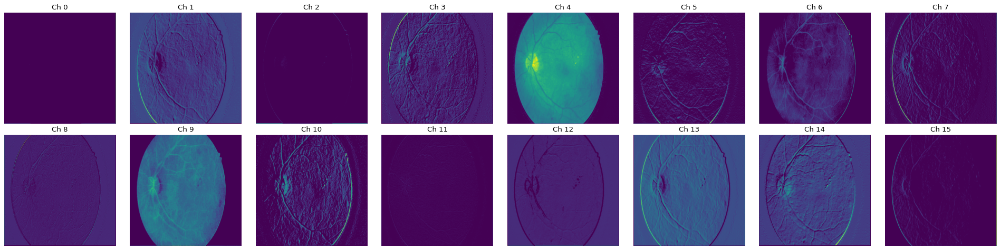

Layer 1


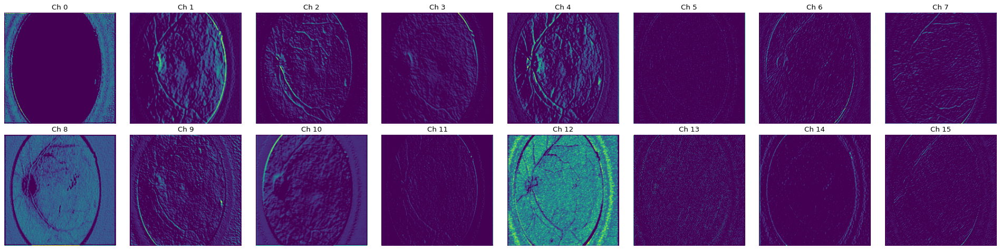

Layer 2


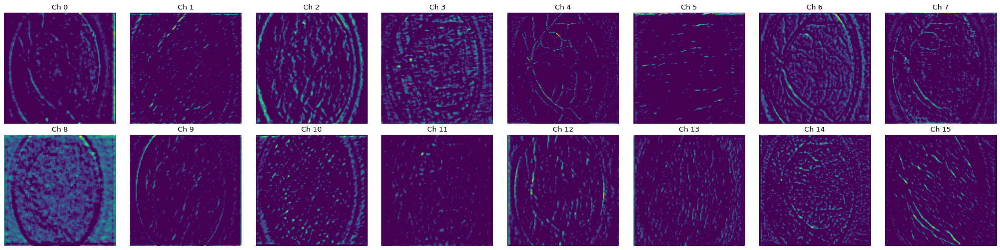

Layer 3


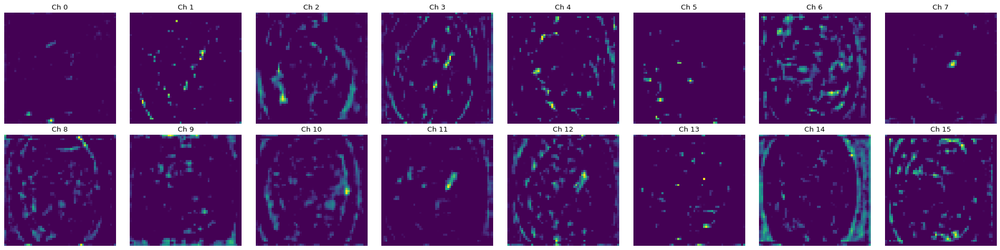

Layer 4


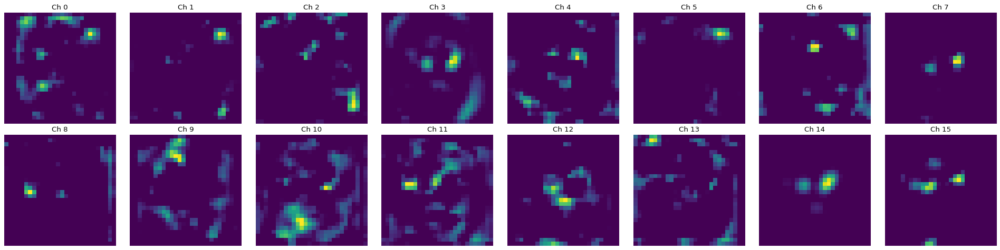

In [132]:
display_all_feature_maps("vgg", "16")

### Resnet 50

Layer 0


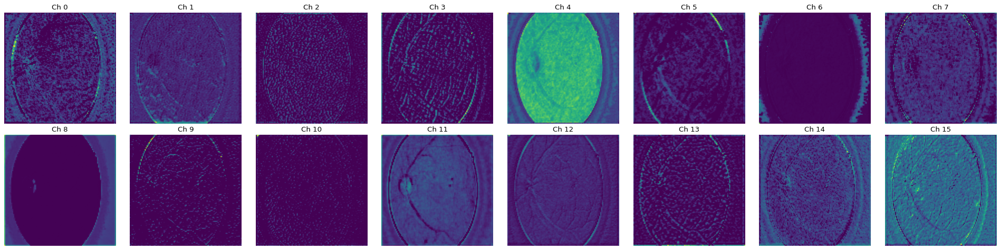

Layer 1


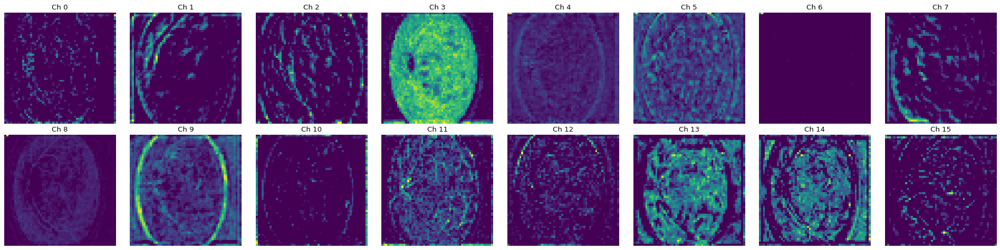

Layer 2


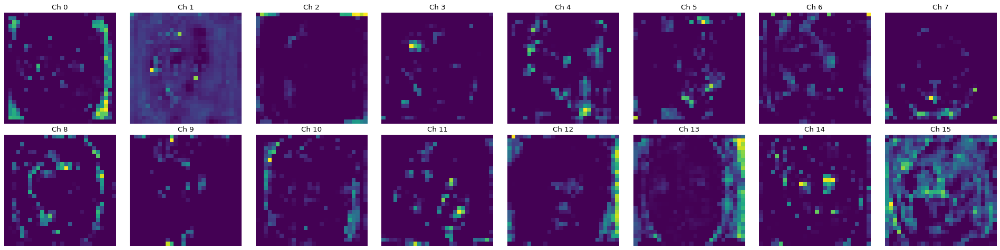

Layer 3


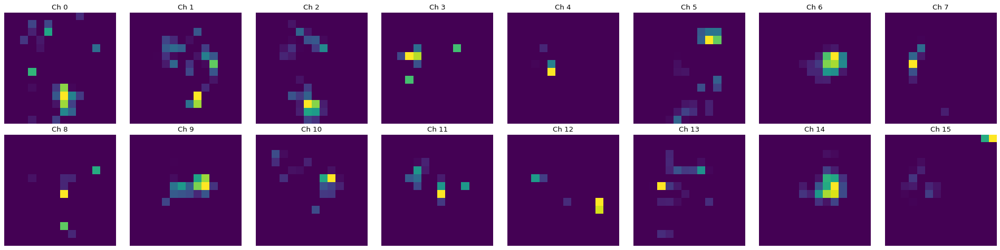

In [133]:
display_all_feature_maps("resnet", "50")

### EfficientNet

Layer 0


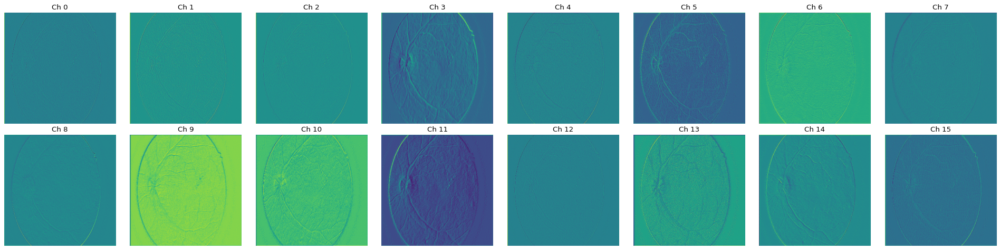

Layer 1


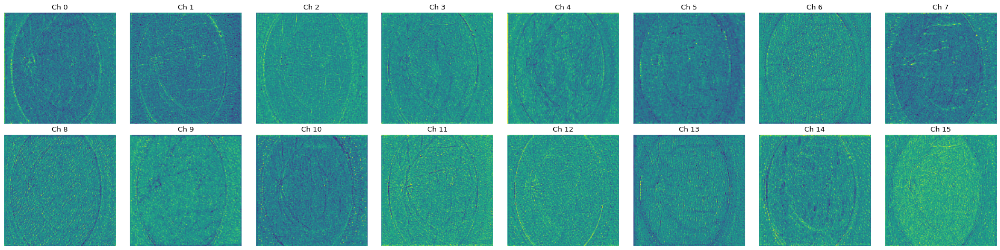

Layer 2


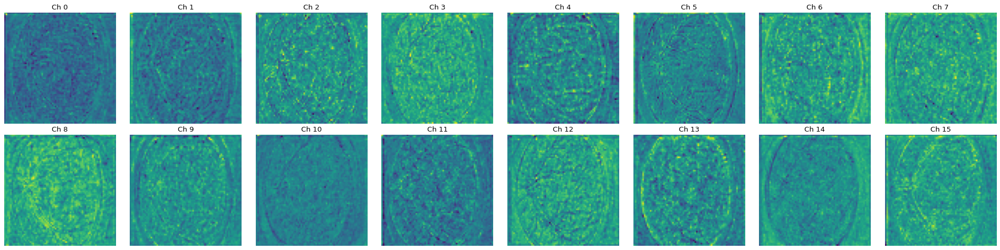

Layer 3


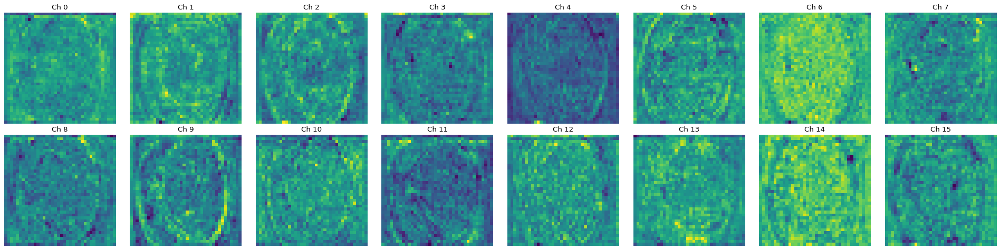

Layer 4


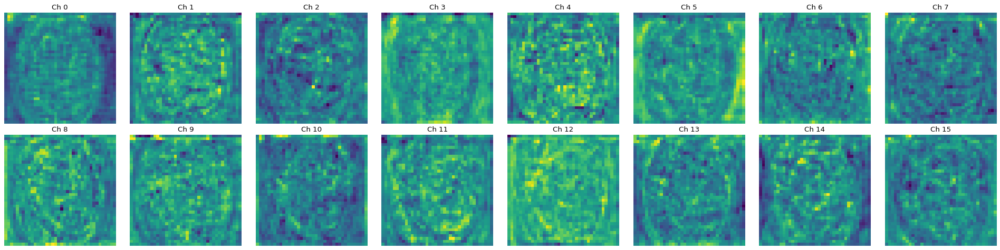

Layer 5


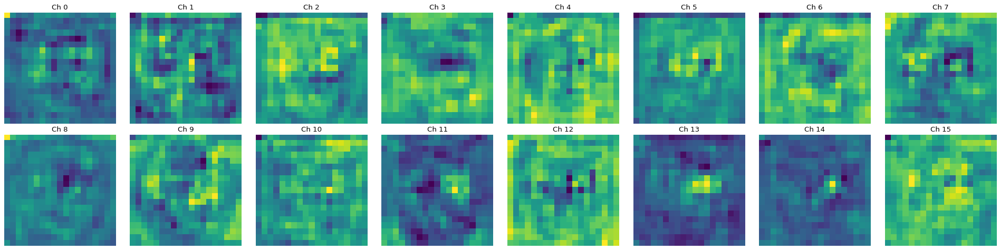

Layer 6


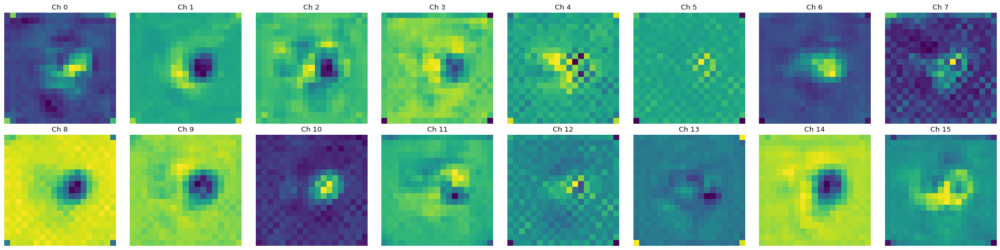

In [134]:
display_all_feature_maps("efficientnet", "b7")

### ConvNext

Layer 0


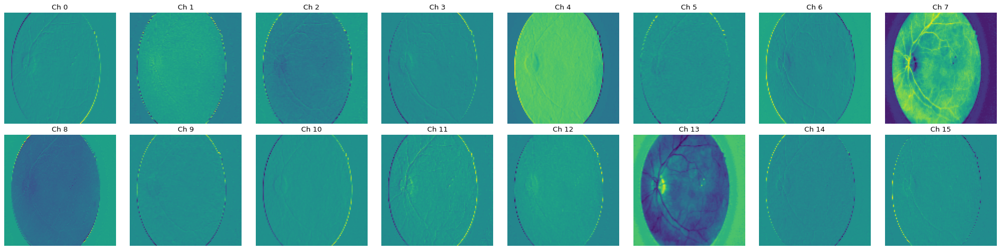

Layer 1


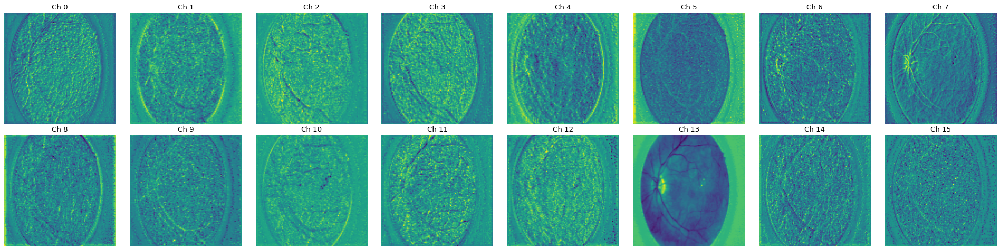

Layer 2


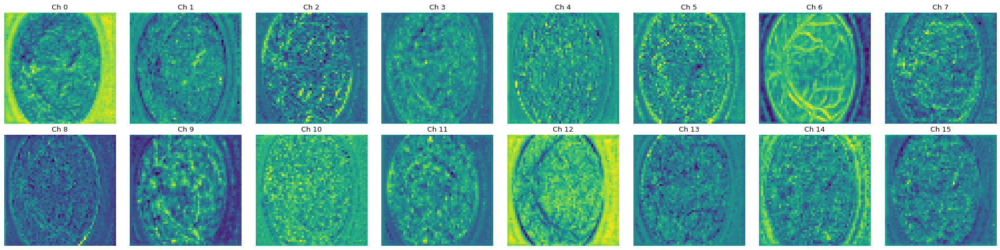

Layer 3


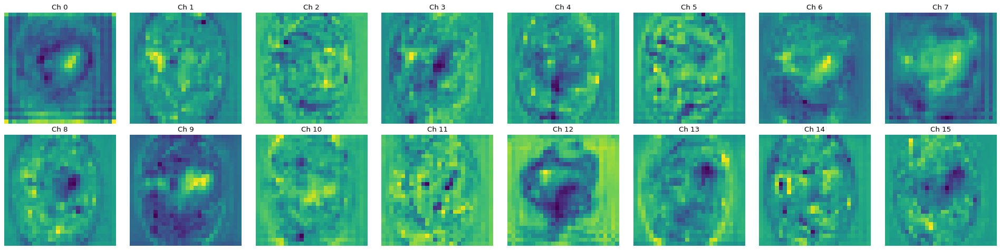

Layer 4


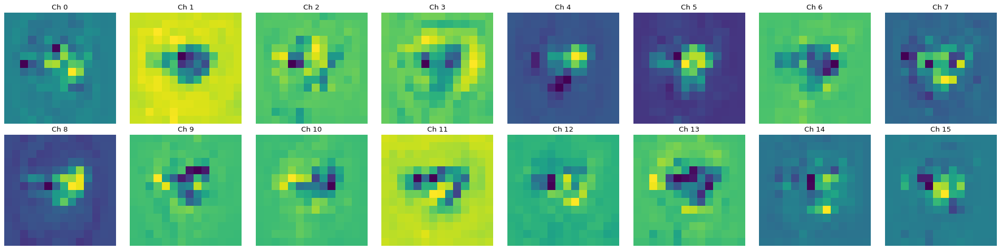

In [135]:
display_all_feature_maps("convnext", "large")